In [1]:
############################################
##      Exoplanet Transit Lightcurve      ##
############################################

## This routine performs the following tasks
## Create master calibration files
## Remove calibrations from light frames
## Source detection and masking for creating 2D background profile
## 2D background estimation and reduction
## Performing aperture photometry
## Calculating average shift between light frames and correcting for them
## Creating light curve for a target star and comparison star

In [2]:
import numpy as np
from astropy.io import fits
from pathlib import Path
from astropy.nddata import CCDData
from itertools import cycle
from ccdproc import ImageFileCollection
import os
from astropy.stats import mad_std
import ccdproc as ccdp
import matplotlib.pyplot as plt
from convenience_functions import show_image
from matplotlib.colors import LogNorm
import astropy.units as u
import glob
import photutils as pht
from photutils.background import Background2D, MedianBackground
from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.segmentation import detect_threshold, detect_sources
from photutils.utils import circular_footprint
from scipy.stats import median_abs_deviation as mad


In [51]:
## STEP 0. Specifiying Locations

# All files are located here:
path = Path('/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim')
# This is where I tell the code to write master dark and flat files
combined_path =  Path('/Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2')
calibrated_path =  Path('/Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2')

# Names for master flat and dark
combined_dark_name = 'master_dark_trimonlyv4.fits'
combined_flat_name = 'master_flat_trimonlyv4.fits'
combined_flat_withdark = 'master_flat_not-reducing_dark_trimonlyv4.fits'
calibrated_darkonly = 'calibrated_light_minus_darkonly_trimonlyv4.fits'
calibrated_darkandflat = 'calibrated_light_minus_dark_div_flat_trimonlyv4.fits'
calibrated_flatonly = 'calibrated_light_div_flatonly_trimonlyv4.fits'


# Sample light frame name
light_frame_name = 'c13a_150210_023444_ori_Trim_only_v4.fits'
light_minus_flat_withdark = 'light_minus_onlyflat_Trimonlyv4.fits'

## Directory including all light frames:
light_frames_dir = Path('/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/light')


In [4]:
## Initial Steps:

## 1. Check out each calibration or data frame manually at the beginning with a tool like ds9. Check and compare counts.
## discard outliers. Take care of trimming and overscan if necessary. Good flats usually have 1/2 to 1/4 count of light
## frames. 

## 2. Adding Necessary Flags to Headers:

## the package ccdproc needs the flag ( UNIT = adu ) in the header. INO headers originally lack this. 

##Taking a look at all the header files in a directory - Run if necessary
#image_path = Path(flat_path)
#image_path.mkdir(parents=True, exist_ok=True)
#im_collection = ImageFileCollection(flat_path)
#im_collection.summary

## checking for necessary headers and making changes if needed:

#for dark_file in dark_files:
#    hdulist = fits.open(dark_file, mode='update')  # Open the file for modification
#    header = hdulist[0].header  # Access the header of the primary HDU

#    if 'BUNIT' not in header:  # Check if the keyword already exists
#        header['BUNIT'] = 'adu'  # Add the keyword with the value 'adu'
#    if 'IMG_TYP' not in header:  # Check if the keyword already exists
#        header['IMG_TYP'] = 'dark'  # Add the keyword with the value 'adu'

#    hdulist.flush()  # Write changes to disk
#    hdulist.close()  # Close the file
 

## 3.Combining Bias 
## If you do not need to scale the dark frames to a different exposure time then do not subtract the bias from the darks. 
## The dark frames will serve to remove both the bias and the dark current your images.



PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/ccdproc/image_collection.py:548: UserWarning: Header from file "/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/0aee9e9bc1d99d8bebef76fdbb40530c_c13a_150212_073805_fri_Trim_only_v4.fits" contains multiple entries for "erase", the pair "erase=1" will be ignored.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/ccdproc/image_collection.py:548: UserWarning: Header from file "/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/0aee9e9bc1d99d8bebef76fdbb40530c_c13a_150212_073805_fri_Tri

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
(890, 340)


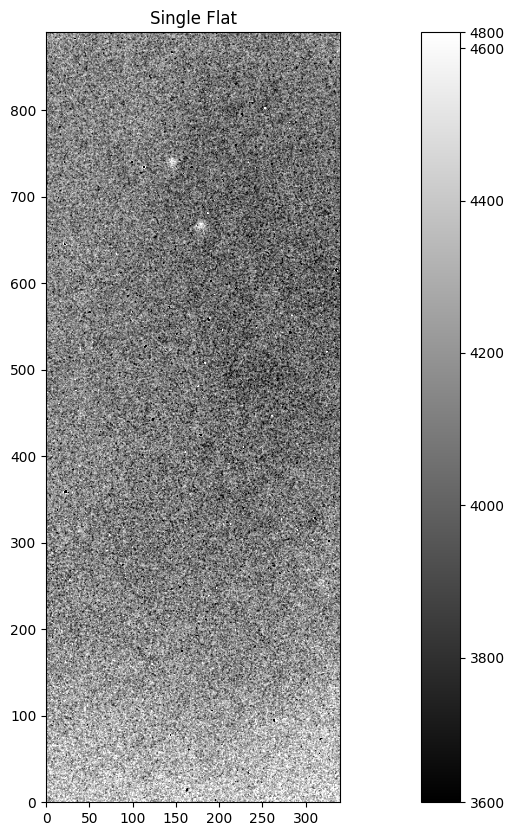

In [5]:
# Vewing one flat file
ifc_raw = ccdp.ImageFileCollection(path)
filtered_files = ifc_raw.files_filtered(OBSTYPE='flat', include_path=True)
if filtered_files:  # Check if the list is not empty
    singl_flat = CCDData.read(filtered_files[0], unit='adu')
    print(singl_flat.shape)

    show_image(singl_flat, cmap='gray')
    plt.title('Single Flat')

else:
    print("No flatfield images found")

Text(0.5, 1.0, 'combined dark')

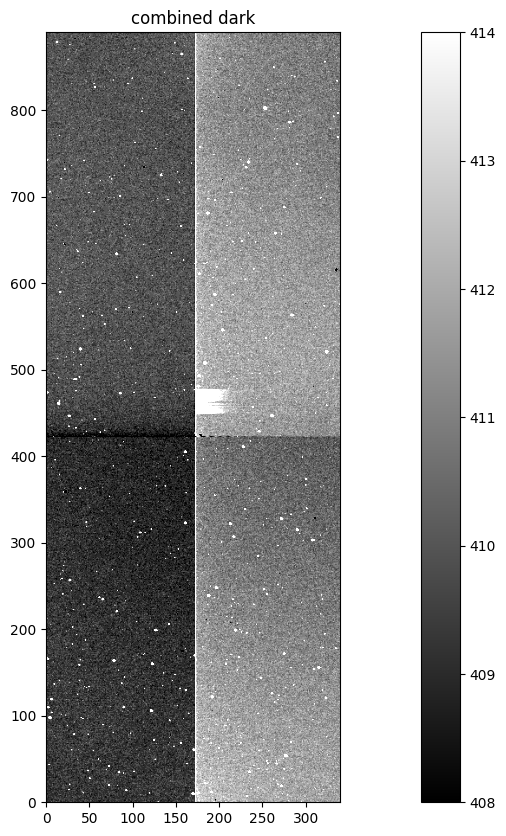

In [6]:
## 4.Combining Darks
## NOTE! Darks should have exposure times closest to light. Never scale darks up in time or it would add noise!

# Check if combined dark file exists
combined_dark_file = combined_path / combined_dark_name
if combined_dark_file.exists():
    # Read the existing combined dark file as a CCDData object
    combined_dark = CCDData.read(combined_dark_file) 

else:
    # Perform the combination if the file doesn't exist
    main_path = ccdp.ImageFileCollection(path)  # Assuming 'path' is defined somewhere

    # Performing the actual combination of the bias images and performing sigmaclipping as well.
    all_darks = main_path.files_filtered(OBSTYPE='DARK', include_path=True)  # Get all DARK files

    combined_dark = ccdp.combine(all_darks,
                                 method='median',
                                 sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                                 sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std,
                                 mem_limit=350e6
                                 )

    combined_dark.meta['comb-med'] = True

    combined_dark.write(combined_path / combined_dark_name, overwrite=True)
    
show_image(combined_dark, cmap='gray')
plt.title('combined dark')

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Text(0.5, 1.0, 'single flat minus master dark')

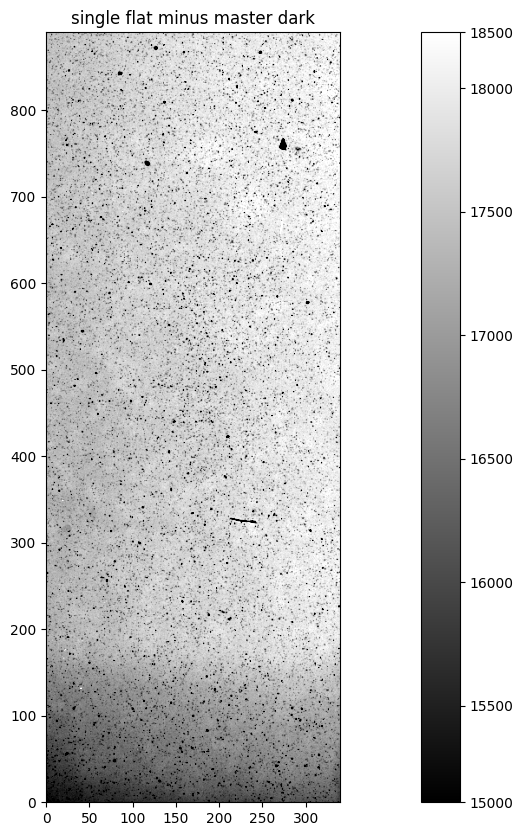

In [209]:
## 5. Subtract combined dark current from a single flat frame:
# where to find the combined dark file
combined_file = os.path.join(combined_path, combined_dark_name )

combined_dark = CCDData.read(combined_file, unit='adu')
# Subtract the loaded combined dark from a_flat_reduced
b_flat_reduced = ccdp.subtract_dark(singl_flat, combined_dark, exposure_time='exptime', exposure_unit=10*u.second, scale=False)

# Display the resulting image
show_image(b_flat_reduced, cmap='gray')
plt.title('single flat minus master dark')

In [7]:
# This part removes combined darks from each flat frame inside flat_path and creates the
#"dark_removed+filename" inside the same directory

filtered_files = ifc_raw.files_filtered(OBSTYPE='flat', include_path=True)
if filtered_files:  # Check if the list is not empty
    b_flat = CCDData.read(filtered_files[0], unit='adu')
else:
    print("No flatfield images found")
# Loop through FLAT files, check for existence, and process
for ccd, file_name in ifc_raw.ccds(OBSTYPE='FLAT', ccd_kwargs={'unit': 'adu'}, return_fname=True):
    output_file = combined_path / ('dark_removed_' + file_name)

    if output_file.exists():
        print(f"File already exists: {output_file}")
    else:
        # Subtract the dark current 
        ccd = ccdp.subtract_dark(ccd, combined_dark,
                                 exposure_time='exptime', exposure_unit=10*u.second)

        # Save the result
        ccd.write(output_file, overwrite=True)


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/ccdproc/image_collection.py:548: UserWarning: Header from file "/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/0aee9e9bc1d99d8bebef76fdbb40530c_c13a_150212_073805_fri_Trim_only_v4.fits" contains multiple entries for "erase", the pair "erase=1" will be ignored.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/ccdproc/image_collection.py:548: UserWarning: Header from file "/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/0aee9e9bc1d99d8bebef76fdbb40530c_c13a_150212_073805_fri_Tri

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/ccdproc/image_collection.py:548: UserWarning: Header from file "/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/0aee9e9bc1d99d8bebef76fdbb40530c_c13a_150212_073805_fri_Trim_only_v4.fits" contains multiple entries for "erase", the pair "erase=1" will be ignored.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/ccdproc/image_collection.py:548: UserWarning: Header from file "/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/0aee9e9bc1d99d8bebef76fdbb40530c_c13a_150212_073805_fri_Trim_only_v4.fits" contains multiple entries for "readout", the pair "readout=UL" will be ignored.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/ccdproc/image_collection.py:548: UserWarning: Header from file "/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/0aee9e9bc1d99d8bebef76fdbb40530c_c13a_150212_073805_fri

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


In [8]:
## Why am I doing this block? Because the "inv_median" function defined below gave 'inf' for the 
## flat files in this data set. So my next step is to figure out what other scales I can use in the combine_flat
## line below
def view_median_fits(fits_file):
  """
  View the median of a FITS file.
  """

  # Open the FITS file
  with fits.open(fits_file) as hdulist:
    # Get the first data extension
    data = hdulist[0].data

    # Calculate the median
    median = np.median(data)

    # Print the median value
    print(f"Median of the FITS file: {median}")

## Example usage:
#fits_file = "/Users/applestore/exo-observe/Data/WASP-12b/trim/c13a_150306_001519_ori_Trim_only_v2.fits"
#view_median_fits(fits_file)

In [9]:
## 6. Creating Master Flat
# To scale the frames so that they have the same median value, we need to define a function that can calculate the inverse of the median given the data.

def inv_median(a):
    return 1 / np.median(a)

# New Way #
# Check if combined flat file exists
combined_flat_file = combined_path / combined_flat_name
if combined_flat_file.exists():
    # Read the existing combined flat file as a CCDData object
    combined_flat = CCDData.read(combined_flat_file) 
    print(f"File already exists: {combined_flat_file}")  # Print the message

else:
    # Perform the combination if the file doesn't exist
    to_combine = glob.glob(str(combined_path / 'dark_removed*'))
    # Check if any files were found
    if not to_combine:
        print("No files found to combine for combined_flat")
    else:
        # Combine the files
        combined_flat = ccdp.combine(to_combine,method='median', scale=inv_median,
                                    sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                                    sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std,
                                    mem_limit=350e6)
        combined_flat.meta['combined'] = True
        combined_flat.write(combined_path / combined_flat_name, overwrite=True)



File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/master_flat_trimonlyv4.fits


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


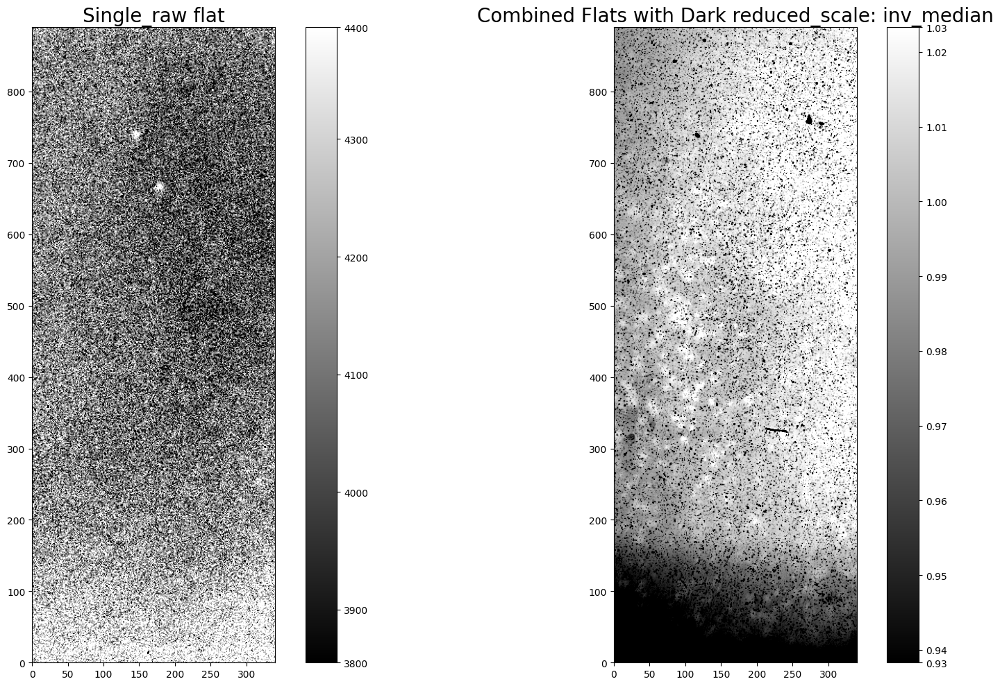

In [10]:
b_flat = CCDData.read(filtered_files[0], unit='adu')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
show_image(b_flat, cmap='gray', ax=ax1, fig=fig, percl=90)
ax1.set_title('Single_raw flat',fontsize=20)
show_image(combined_flat, cmap='gray', ax=ax2, fig=fig, percl=90)
#ax2.imshow(combined_flat, vmin=50, vmax=90, origin='lower')

ax2.set_title('Combined Flats with Dark reduced_scale: inv_median',fontsize=20)
plt.tight_layout()
#fig.savefig("WASP12b-flat2_scale_inv_median.png")

In [ ]:
##### ATTENTION ########
## Steps 8 to 12 show how the process of calibration files and 2D bkgd reduction is done for a single light frame in detail.
## If you only want to perform these tasks on a bulk of data stored in the 'light_frames_dir' directory at the beginning of
## the code go to step 13 and continue from there.

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_onlyf6c490bc76aac77dda823c3d418db4d7_c13a_150212_074254_fri_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_falt_minus_darkf6c490bc76aac77dda823c3d418db4d7_c13a_150212_074254_fri_Trim_only_v4.fits


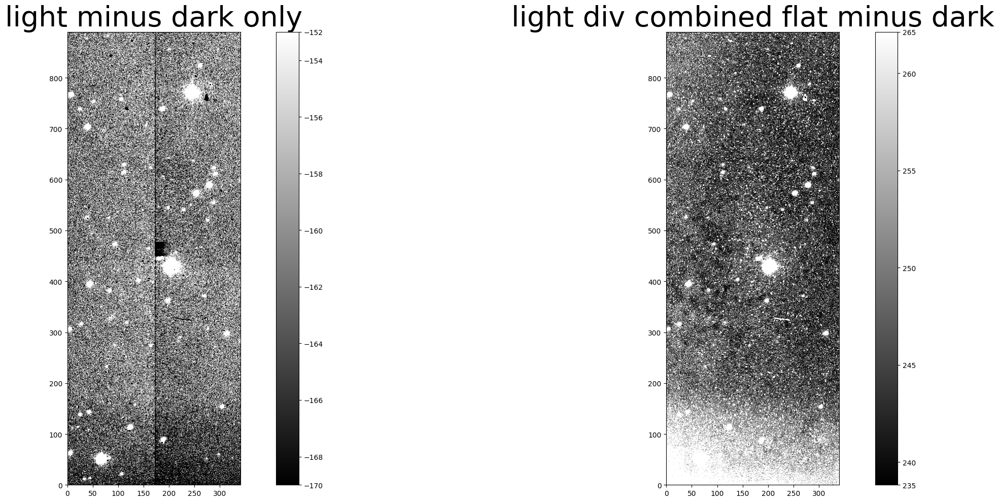

In [14]:
## 8. Subtracting the flat from a light Frame

# Before Performing this step make sure of the following things:
#    1- choose the light frame with the closest exposure time to the dark frames
#    2- good Flats should have their count to be 1/2 to 1/4 count of light frames

raw_data = CCDData.read(path.joinpath(light_frame_name), unit='adu')
### Performing subtraction of dark from light)###
reducedark = ccdp.subtract_dark(raw_data, combined_dark,exposure_time='EXPTIME', exposure_unit=u.second)
### Light minus Flat and Dark ###
reducefd = ccdp.flat_correct(raw_data, combined_flat)

# Check if output files already exist
output_files = [
    combined_path / ('light_minus_dark_only' + file_name),
    combined_path / ('light_div_falt_minus_dark' + file_name)
]

for output_file in output_files:
    if output_file.exists():
        print(f"File already exists: {output_file}")
    else:
        # Write the output to a file
        if output_file.name == ('light_minus_dark_only' + file_name):
            reducedark.write(output_file, overwrite=True)
        elif output_file.name == ('light_div_falt_minus_dark' + file_name):
            reducefd.write(output_file, overwrite=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

show_image(reducedark, cmap='gray', ax=ax1, fig=fig, percl=90)
ax1.set_title('light minus dark only', fontsize=40)
show_image(reducefd, cmap='gray', ax=ax2, fig=fig, percl=90)
ax2.set_title('light div combined flat minus dark',fontsize=40)
plt.tight_layout()
#fig.savefig("030421WASP12b_c13a_150306_000853_ori_Calibration_Trimonly_v3.png")

In [17]:
import pandas as pd
from astropy.stats import biweight_location, sigma_clipped_stats
means, medians, stds = sigma_clipped_stats(reducefd, sigma=3.0)

lights = {
    'Data Set': ['light div combined flat minus dark'],
    'Mean': [means],
    'Median': [medians],
    'Standard Deviation': [stds]
}

df = pd.DataFrame(lights)

print(df.to_string(index=False))  # Print the DataFrame as a table

                          Data Set       Mean     Median  Standard Deviation
light div combined flat minus dark 248.332733 247.484106            8.095361


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               


Text(0.5, 1.0, 'reducefd_mask|threshold_nsigma3.0|footprint_radius5 ')

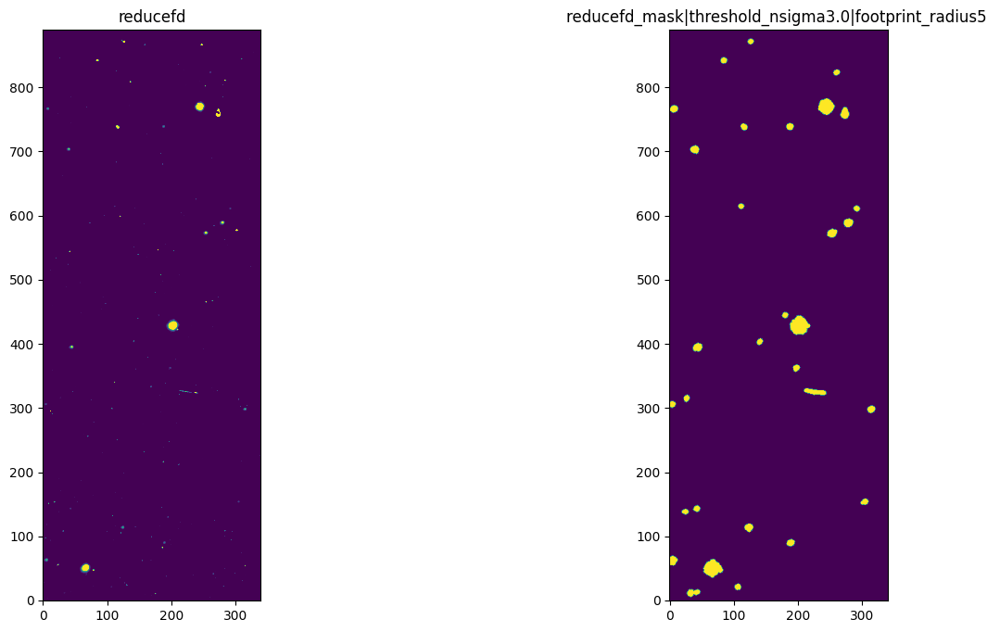

In [49]:
## 9. Source Detection and Masking for creating 2D bkgd ####

## Defining Masks

## Sigma_clipping is: pixels that are above or below a specified sigma level from the median are discarded 
## and the statistics are recalculated.

## reduceflat is light minus flat only
comb_flat = CCDData.read(combined_flat_file)
### Light minus Flat only ###
reduceflat = ccdp.flat_correct(raw_data, comb_flat)
sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
threshold = detect_threshold(reduceflat.data, nsigma=5, sigma_clip=sigma_clip)
segment_img = detect_sources(reduceflat.data, threshold, npixels=10)
footprint = circular_footprint(radius=3)
maskd = segment_img.make_source_mask(footprint=footprint)

## reduce is light div combined flat minus dark
thresholds = detect_threshold(reducefd.data, nsigma=5, sigma_clip=sigma_clip)
segment_imgs = detect_sources(reducefd.data, thresholds, npixels=10)
footprints = circular_footprint(radius=3)
masks = segment_img.make_source_mask(footprint=footprints)


# Plotting the mask

f,axs=plt.subplots(1,2,figsize=(16,8))
axs[0].imshow(reducefd,vmin=300,vmax=600,origin='lower')
axs[0].set_title("reducefd")
axs[1].imshow(masks,origin='lower')
axs[1].set_title("reducefd_mask|threshold_nsigma3.0|footprint_radius5 ")
#f.savefig("mask1.eps")

In [20]:
## 10. Background estimation:

# We start by creating a Background2D object using a box size of50x50 and a 3x3 filter. We will estimate the 
## background level in each mesh as the sigma-clipped median using an instance of Median Background

## what is 50x50-> This pair of numbers represents the size of the block used for calculating the background. In this case, it’s a square block with a width and height of 50 pixels.
## what is filter_size=(3,3): This parameter determines the size of a smoothing filter applied to the calculated background image

sigma_clip = SigmaClip(sigma=3.0)
bkg_estimator = MedianBackground()
bkg = Background2D(reduceflat.data, (50, 50),mask=maskd, filter_size=(3, 3),
                   sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)
## the following is for reduce which is light div combined flat minus dark
sigma_clips = SigmaClip(sigma=3.0)
bkg_estimators = MedianBackground()
bkgs = Background2D(reducefd.data, (50, 50),mask=masks, filter_size=(3, 3),
                   sigma_clip=sigma_clips, bkg_estimator=bkg_estimators)

bgktable = {
    'Data Set': ['light div combined flat only', 'light div combined flat minus dark'],
    'Background Median': [bkg.background_median, bkgs.background_median],
    'Background RMS Median': [bkg.background_rms_median, bkgs.background_rms_median]
}

df = pd.DataFrame(bgktable)

print(df.to_string(index=False))  # Print the DataFrame as a table

                          Data Set  Background Median  Background RMS Median
      light div combined flat only         246.162648               6.309474
light div combined flat minus dark         246.162648               6.309474


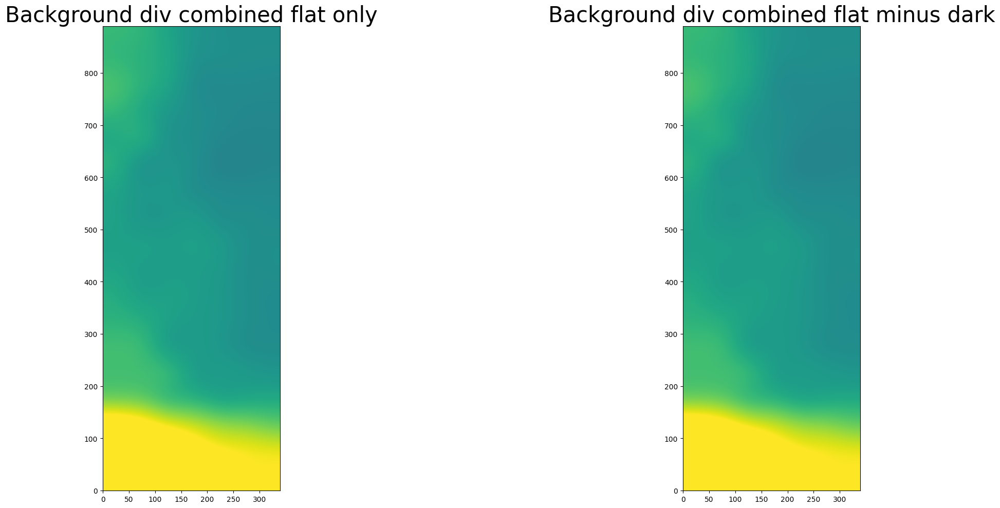

In [23]:
#Let’s plot the background image:
#show_image(bkg.background, cmap='gray', percl=90)

figs, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

ax1.imshow(bkg.background, vmin=235, vmax=255, origin='lower')
ax1.set_title('Background div combined flat only',fontsize=30)

ax2.imshow(bkgs.background, vmin=235, vmax=255, origin='lower')
ax2.set_title('Background div combined flat minus dark',fontsize=30)
plt.tight_layout()
#figs.savefig("Wasp12b-2D_bckg_comparison2.png")

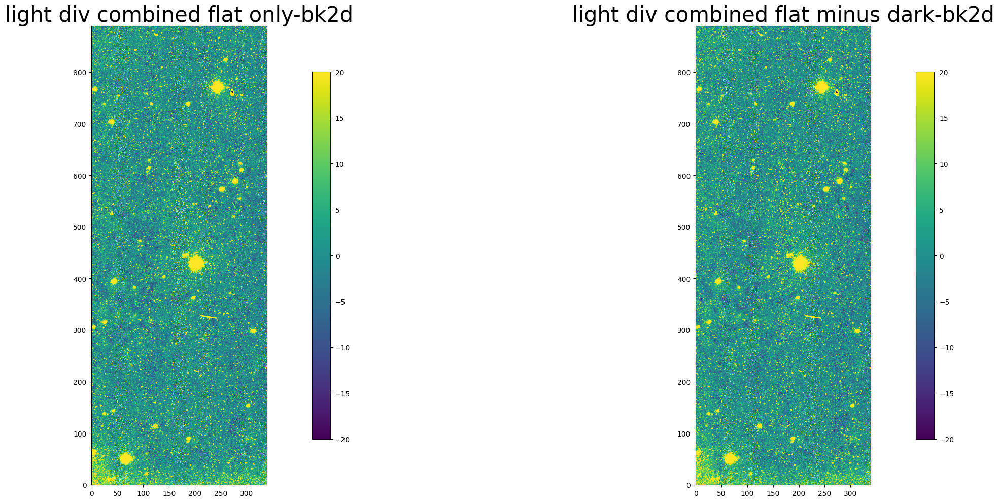

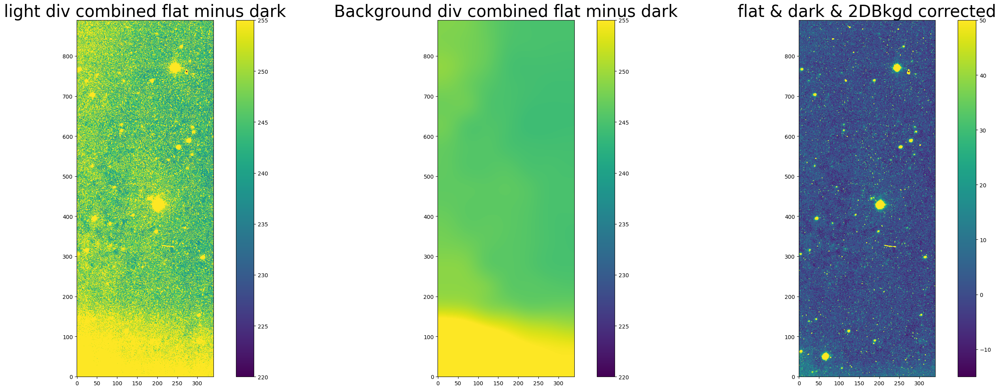

In [27]:
## 11. Subtracting Background

## The 3 following lines help with figuring out the boundaries of vmin & vmax below
#show_image(reduceflat.data- bkg.background, cmap='gray',percl=90)
#show_image(reducefd.data- bkgs.background, cmap='gray',percl=90)

figd, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
im1 = ax1.imshow(reduceflat.data - bkg.background, vmin=-20, vmax=20, origin='lower')
ax1.set_title('light div combined flat only-bk2d', fontsize=30)
im2 = ax2.imshow(reducefd.data - bkgs.background, vmin=-20, vmax=20, origin='lower')
ax2.set_title('light div combined flat minus dark-bk2d', fontsize=30)

# Add colorbars
figd.colorbar(im1, ax=ax1, orientation='vertical', shrink=0.8)
figd.colorbar(im2, ax=ax2, orientation='vertical', shrink=0.8)

plt.tight_layout()
plt.show()
#figd.savefig("030421_Wasp12b_calibration_v2.png")


figy, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))
iu1 = ax1.imshow(reducefd, vmin=220, vmax=255, origin='lower')
ax1.set_title('light div combined flat minus dark', fontsize=30)
iu2 = ax2.imshow(bkgs.background, vmin=220, vmax=255, origin='lower')
ax2.set_title('Background div combined flat minus dark', fontsize=30)
iu3 = ax3.imshow(reducefd.data - bkgs.background, vmin=-15, vmax=50, origin='lower')
ax3.set_title('flat & dark & 2DBkgd corrected', fontsize=30)


# Add colorbars
figy.colorbar(iu1, ax=ax1, orientation='vertical')
figy.colorbar(iu2, ax=ax2, orientation='vertical')
figy.colorbar(iu3, ax=ax3, orientation='vertical')
#figy.colorbar(iu3, ax=ax3, orientation='vertical', shrink=0.7)

plt.tight_layout()
plt.show()
#figy.savefig("Wasp12b-flat2-fld2Dbkg.png")


In [28]:
## 12. Writing the data in the above images to its files
light_frame_base = light_frame_name.rsplit('.', 1)[0]
print(light_frame_base)

flatonly = reduceflat.data - bkgs.background
flatonly_ccd = CCDData(data=flatonly, header=raw_data.header, unit=raw_data.unit) 
output_flatname = f"{light_frame_base}_{calibrated_flatonly}"
fits.writeto(calibrated_path / output_flatname, flatonly_ccd.data, 
            header=flatonly_ccd.header, overwrite=True)


flatanddark = reducefd.data - bkg.background
flatanddark_ccd = CCDData(data=flatanddark, header=raw_data.header, unit=raw_data.unit)
output_fdname = f"{light_frame_base}_{calibrated_darkandflat}"
fits.writeto(calibrated_path / output_fdname, flatanddark_ccd.data, 
            header=flatanddark_ccd.header, overwrite=True)

c13a_150210_023444_ori_Trim_only_v4


In [54]:
###################################################
## 13. Performing all the above tasks for all light  ##
## frames specified at the beginning of the code ##
## and saving them to calibrated folder          ##
###################################################

# Read the combined flat frame
comb_flat = CCDData.read(combined_flat_file)

# Iterate over all files in the light frames directory
for light_frame_file in light_frames_dir.glob('*.fits'):  # Assuming the light frame files are .fits

    light_frame_name = light_frame_file.name  # Extract the file name

    # Read the light frame
    raw_data = CCDData.read(light_frame_file, unit='adu')

    # Performing subtraction of dark from light
    reducedark = ccdp.subtract_dark(raw_data, combined_dark, exposure_time='EXPTIME', exposure_unit=u.second)

    # Light minus Flat and Dark
    reducefd = ccdp.flat_correct(reducedark, comb_flat)

    # Prepare output filenames
    file_name = light_frame_file.stem
    output_light_minus_dark = combined_path / (f'light_minus_dark_only_{file_name}.fits')
    output_light_div_flat_minus_dark = combined_path / (f'light_div_flat_minus_dark_{file_name}.fits')

    # Check if output files already exist
    if output_light_minus_dark.exists():
        print(f"File already exists: {output_light_minus_dark}")
    else:
        reducedark.write(output_light_minus_dark, overwrite=True)

    if output_light_div_flat_minus_dark.exists():
        print(f"File already exists: {output_light_div_flat_minus_dark}")
    else:
        reducefd.write(output_light_div_flat_minus_dark, overwrite=True)

    # Step 9: Source Detection and Masking for creating 2D background
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)

    # Thresholding for light minus flat only (reduceflat)
    reduceflat = ccdp.flat_correct(raw_data, comb_flat)
    threshold_flat = detect_threshold(reduceflat.data, nsigma=5, sigma_clip=sigma_clip)
    segment_img_flat = detect_sources(reduceflat.data, threshold_flat, npixels=10)
    footprint_flat = circular_footprint(radius=3)
    mask_flat = segment_img_flat.make_source_mask(footprint=footprint_flat)

    # Thresholding for light div flat minus dark (reducefd)
    threshold_fd = detect_threshold(reducefd.data, nsigma=5, sigma_clip=sigma_clip)
    segment_img_fd = detect_sources(reducefd.data, threshold_fd, npixels=10)
    footprint_fd = circular_footprint(radius=3)
    mask_fd = segment_img_fd.make_source_mask(footprint=footprint_fd)

    # Step 10: Background Estimation for light div flat minus dark (reducefd)
    bkg_estimators = MedianBackground()
    bkg_fd = Background2D(reducefd.data, (50, 50), mask=mask_fd, filter_size=(3, 3), 
                          sigma_clip=sigma_clip, bkg_estimator=bkg_estimators)

    # Step 11: Subtracting Background
    flatanddark = reducefd.data - bkg_fd.background
    flatanddark_ccd = CCDData(data=flatanddark, header=raw_data.header, unit=raw_data.unit)

    # Writing the output to a new file
    calibrated_darkandflat = f"{file_name}_calibrated_darkandflat.fits"
#    output_fdname = combined_path / calibrated_darkandflat
    output_fdname = calibrated_path / calibrated_darkandflat
    fits.writeto(output_fdname, flatanddark_ccd.data, header=flatanddark_ccd.header, overwrite=True)

    print(f"Processed and saved {output_fdname}")

PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_023836_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_023836_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023836_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_024230_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_024230_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024230_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_023444_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_023444_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023444_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_024621_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_024621_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024621_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_024346_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_024346_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024346_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_023719_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_023719_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023719_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_024111_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_024111_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024111_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_024505_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_024505_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024505_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_023600_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_023600_ori_Trim_only_v4.fits


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023600_ori_Trim_only_v4_calibrated_darkandflat.fits
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_minus_dark_only_c13a_150210_023954_ori_Trim_only_v4.fits
File already exists: /Users/applestore/exo-observe/Data/WASP-12b-20150209/combined2/light_div_flat_minus_dark_c13a_150210_023954_ori_Trim_only_v4.fits
Processed and saved /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023954_ori_Trim_only_v4_calibrated_darkandflat.fits


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/1697166342.py:3: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=4.0, threshold=10.*bkg.background_rms_median,exclude_border=True,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/1697166342.py:9: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  from photutils import CircularAperture


 id     xcentroid          ycentroid             fwhm        ...         sky                peak               flux                mag        
--- ------------------ ------------------ ------------------ ... ------------------- ------------------ ------------------ -------------------
  1  176.0526488841234 12.173665782825775 2.8897639292909787 ... -30.799355530225967  40.06618786965623 446.79314651269146  -6.625266256819828
  2  272.6281207983212 16.191360835653484  2.581309227476368 ... -12.413849589251967  9.868323662191344   49.4555661597951  -4.235537944911072
  3 181.89728651652584 22.933871043622645 2.5985287663955394 ...  -7.732369204186313 17.817585637955318  88.25815499821957  -4.864387111129751
  4 127.62780781589909 24.661455629968977 3.0184349887074293 ... -20.098687256251814   25.4867592439985 253.99267630219808   -6.01205298557152
  5 234.97147655937633  36.12752624594572   2.86042668080612 ... -14.588258903570974 19.752946902138873  180.6462576384092  -5.642072422318597

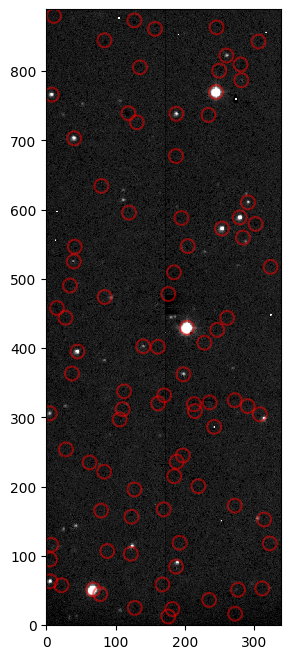

In [66]:
## STEP 14. find Sources and calculate basic information for one file ####

daofind = pht.IRAFStarFinder(fwhm=4.0, threshold=10.*bkg.background_rms_median,exclude_border=True, 
                             sharplo= 0.5, sharphi=2.0, roundlo=0.0, roundhi=0.7)
sources = daofind(flatanddark)
print(sources)
print(sources.colnames)

from photutils import CircularAperture
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=10.)
plt.figure(figsize=(8,8))
plt.imshow(flatanddark, cmap='Greys_r', origin='lower', vmin=-20,vmax=200, interpolation='nearest') 
apertures.plot(color='red', lw=1.5, alpha=0.5)

In [67]:
# We can calculate gain and readout noise from pairs of bias and flats
# It’s always best to choose a low-signal area for gain and readout noise estimation.
# The algorithm come from the IRAF FINDGAIN program, please refer to its help information

## calculate gain and read noise
#from astropy.stats import sigma_clipped_stats
#biasfile1='/Users/applestore/exo-observe/Data/WASP-12b/trim/c13a_150306_232107_zri_Trim_only_v3.fits'
#biasfile2='/Users/applestore/exo-observe/Data/WASP-12b/trim/c13a_150306_231932_zri_Trim_only_v3.fits'
#flatfile1='/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/c13a_150210_024505_ori_Trim_only_v4.fits'
#flatfile2='/Users/applestore/exo-observe/Data/WASP-12b-20150209/trim/c13a_150210_024505_ori_Trim_only_v4.fits'
##bias1=fits.getdata(biasfile1)[512-125:512+125,460-125:460+125]
#bias1=fits.getdata(biasfile1)
#bias2=fits.getdata(biasfile2)
#flat1=fits.getdata(flatfile1)
#flat2=fits.getdata(flatfile2)
#mean_flat1=np.median(flat1)
#mean_flat2=np.median(flat2)
#mean_bias1=np.median(bias1)
#mean_bias2=np.median(bias2)
#_,_,std_biasdiff=sigma_clipped_stats(bias1-bias2,sigma=4.0,maxiters=2)
#_,_,std_flatdiff=sigma_clipped_stats(flat1-flat2,sigma=4.0,maxiters=2)
#print(mean_bias1,mean_bias2,mean_flat1,mean_flat2,std_biasdiff,std_flatdiff)
#gain=((mean_flat1+mean_flat2)-(mean_bias1+mean_bias2))/((std_flatdiff**2-std_biasdiff**2))
#rdnoise=gain*std_biasdiff/np.sqrt(2)
#print("gain: ",gain, "readout noise:",rdnoise)



## calculate gain and read noise
## I am still fabricating this - coz code above don't work!:

gain = 3.0

In [68]:
# The error Estimation Step: 

from photutils.utils import calc_total_error 
error=calc_total_error(flatanddark, bkg.background_rms, gain) 
print(np.median(error))

13.783897872673817


In [69]:
## 15. Aperture photometry for a single file: an example


## aperture photometry
from astropy.table import Table
from astropy import table
radii=[3,4,5,6,8,10,12,15,20,25] ## aperture radii in pixels
positions=[(ix,iy) for ix,iy in zip(sources['xcentroid'],sources['ycentroid'])] 
apertures = [pht.CircularAperture(positions, r=r) for r in radii]
aper_phot= pht.aperture_photometry(flatanddark, apertures, error=error) 
print(aper_phot.colnames)
#convert flux to magnitude, using a instrumental zeropoint of 25
for i in range(len(radii)): 
    fcol='aperture_sum_'+str(i) 
    ecol='aperture_sum_err_'+str(i) 
    flux=aper_phot[fcol]
    fluxerr=aper_phot[ecol] 
    mag=-2.5*np.log10(flux)+25 
    magerr=2.5/(flux*np.log(10))*fluxerr 
    aper_phot[fcol]=mag
    aper_phot[ecol]=magerr 
    aper_phot.rename_column(fcol,'mag_'+str(i)) 
    aper_phot.rename_column(ecol,'magerr_'+str(i))

print(aper_phot)

['id', 'xcenter', 'ycenter', 'aperture_sum_0', 'aperture_sum_err_0', 'aperture_sum_1', 'aperture_sum_err_1', 'aperture_sum_2', 'aperture_sum_err_2', 'aperture_sum_3', 'aperture_sum_err_3', 'aperture_sum_4', 'aperture_sum_err_4', 'aperture_sum_5', 'aperture_sum_err_5', 'aperture_sum_6', 'aperture_sum_err_6', 'aperture_sum_7', 'aperture_sum_err_7', 'aperture_sum_8', 'aperture_sum_err_8', 'aperture_sum_9', 'aperture_sum_err_9']
 id      xcenter            ycenter             mag_0        ...       mag_8               magerr_8              mag_9               magerr_9      
           pix                pix                            ...                                                                                   
--- ------------------ ------------------ ------------------ ... ------------------ ---------------------- ------------------ ---------------------
  1  176.0526488841234 12.173665782825775                nan ...                nan  -0.006260111595573372                nan  

/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/170572014.py:9: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  apertures = [pht.CircularAperture(positions, r=r) for r in radii]
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/170572014.py:10: DeprecationWarning: `photutils.aperture_photometry` is a deprecated alias for `photutils.aperture.aperture_photometry` and will be removed in the future. Instead, please use `from photutils.aperture import aperture_photometry` to silence this warning.
  aper_phot= pht.aperture_photometry(flatanddark, apertures, error=error)
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/170572014.py:18: RuntimeWarning: invalid value encountered in log10
  mag=-2.5*np.log10(flux)+25


In [83]:
## 16. Aperture photometry for all frames specified below:

cfiles = glob.glob(f"{calibrated_path.as_posix()}/*flat.fits") # science frames 

cfiles.sort() # in alphabetic order 
radii=[3,4,5,6,8,10,12,15,20,25] ## aperture radii in pixels

sigma_clip = SigmaClip(sigma=3.)
for i, ifile in enumerate(cfiles):
    print("aperture photometry :", i+1, len(cfiles), ifile)
    rootname, _ = os.path.splitext(ifile)
    catfile = rootname + '-cat.fits'
    data = fits.getdata(ifile)
    footprint = circular_footprint(radius=5)
    mask = segment_img.make_source_mask(footprint=footprint) 
#    bkg_estimator = pht.SExtractorBackground()
    bkg_estimator = MedianBackground()
    bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
    bkg_estimator=bkg_estimator, exclude_percentile=25.0)
    print(bkg.background_median,bkg.background_rms_median)
    daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
                                 , sharplo=0.5, sharphi=2.0, roundlo=0.0, roundhi=0.7)
    sources = daofind(data - bkg.background)
    positions=[(ix,iy) for ix,iy in zip(sources['xcentroid'],sources['ycentroid'])] 
    apertures = [pht.CircularAperture(positions, r=r) for r in radii] 
    error=calc_total_error(data-bkg.background, bkg.background_rms, gain)
    aper_phot= pht.aperture_photometry(data - bkg.background, apertures, error=error) 
    print(len(aper_phot))
    aper_phot.write(catfile,overwrite=True)

PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               


aperture photometry : 1 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023444_ori_Trim_only_v4_calibrated_darkandflat.fits
0.09774044220722544 6.398306385782946


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

220
aperture photometry : 2 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023600_ori_Trim_only_v4_calibrated_darkandflat.fits
0.10327430233180479 6.413924263573756


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

210
aperture photometry : 3 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023719_ori_Trim_only_v4_calibrated_darkandflat.fits
0.12084025172028134 6.350864365315049


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

223
aperture photometry : 4 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023836_ori_Trim_only_v4_calibrated_darkandflat.fits
0.15187784872804855 6.3372632924269885


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

225
aperture photometry : 5 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023954_ori_Trim_only_v4_calibrated_darkandflat.fits
0.06637197613839163 6.334473213664956


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

220
aperture photometry : 6 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024111_ori_Trim_only_v4_calibrated_darkandflat.fits
0.08003983189820474 6.250328484379599


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

225
aperture photometry : 7 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024230_ori_Trim_only_v4_calibrated_darkandflat.fits
0.10868363117015889 6.284724813713811


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

205
aperture photometry : 8 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024346_ori_Trim_only_v4_calibrated_darkandflat.fits
0.12575050038873314 6.284174664544614


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

215
aperture photometry : 9 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024505_ori_Trim_only_v4_calibrated_darkandflat.fits
0.03858733698709216 6.2954915979650306


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:26: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.a

218
aperture photometry : 10 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_024621_ori_Trim_only_v4_calibrated_darkandflat.fits
0.12170416081036706 6.317050709633543


/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:19: DeprecationWarning: `photutils.Background2D` is a deprecated alias for `photutils.background.Background2D` and will be removed in the future. Instead, please use `from photutils.background import Background2D` to silence this warning.
  bkg = pht.Background2D(data, (64, 64), mask=mask, filter_size=(3, 3), sigma_clip=sigma_clip,
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/465233271.py:22: DeprecationWarning: `photutils.IRAFStarFinder` is a deprecated alias for `photutils.detection.IRAFStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import IRAFStarFinder` to silence this warning.
  daofind = pht.IRAFStarFinder(fwhm=3.0, threshold=10.*bkg.background_rms_median,exclude_border=True
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/photutils/detection/irafstarfinder.py:474: RuntimeWarning: invalid value encountered in 

226


PIXXMIT                        / Number of pixels returned per ADC go            [astropy.io.fits.card]
PIXXMIT                        / Number of pixels returned per ADC go           
PIXOFFST                       / Valid pixel offset within ADC go                [astropy.io.fits.card]
PIXOFFST                       / Valid pixel offset within ADC go               


Text(0.5, 1.0, 'image 2')

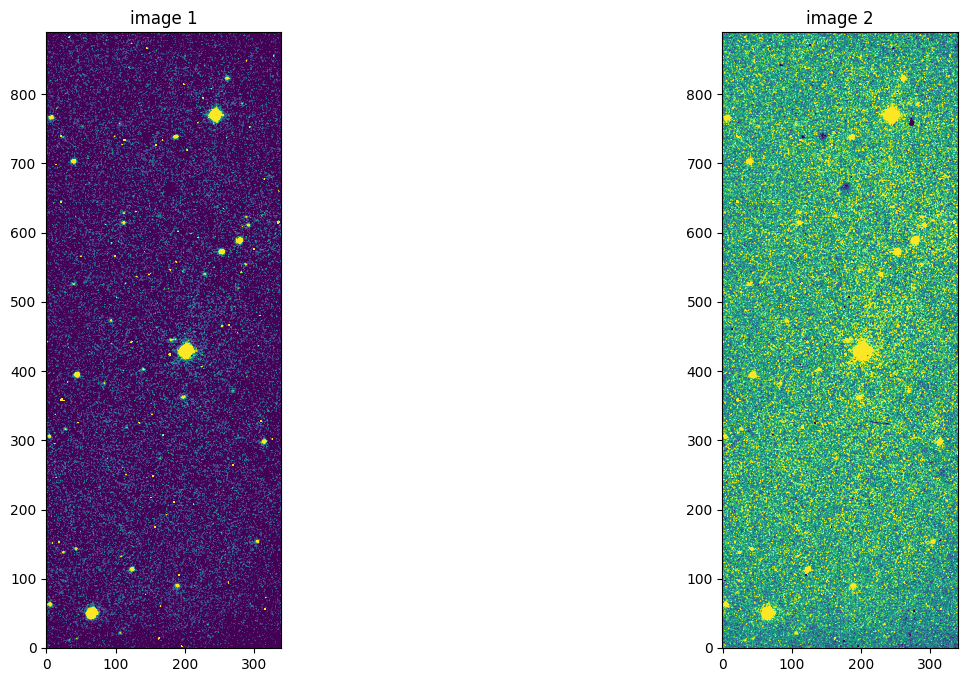

In [84]:
#display two images to see the shift between two images:
f,axs=plt.subplots(1,2,figsize=(16,8))
data3=fits.getdata('/Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated/c13a_150210_023444_ori_Trim_only_v4_calibrated_light_div_flatonly_trimonlyv4.fits')
data4=fits.getdata('/Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated/c13a_150210_023444_ori_Trim_only_v4_calibrated_light_minus_dark_div_flat_trimonlyv4.fits')
axs[0].imshow(data3,vmin=0,vmax=50,origin='lower')
axs[0].set_title("image 1")
axs[1].imshow(data4,vmin=0,vmax=50,origin='lower')
axs[1].set_title("image 2")

3.0 1.0


Text(0.5, 1.0, 'y shift')

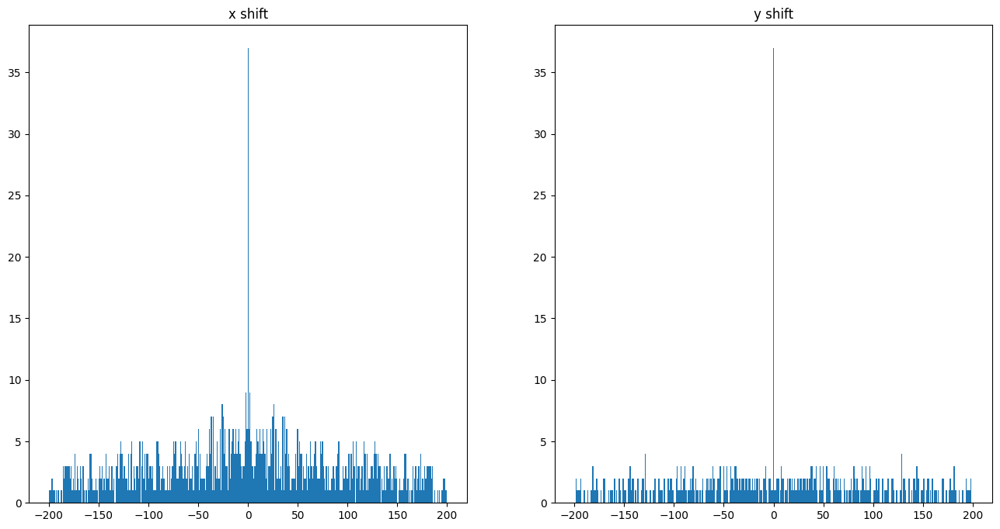

In [85]:
## 17. example: calculate average shifts between two different images

cat1 = Table.read('/Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated/c13a_150210_023444_ori_Trim_only_v4_calibrated_light_minus_dark_div_flat_trimonlyv4-cat.fits')
cat2 = Table.read('/Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated/c13a_150210_023444_ori_Trim_only_v4_calibrated_light_minus_dark_div_flat_trimonlyv4-cat.fits')
x1=cat1['xcenter']
y1=cat1['ycenter']
x2=cat2['xcenter']
y2=cat2['ycenter']
ncat1=len(cat1)
ncat2=len(cat2)
XX=[]
YY=[]
for i in range(ncat2):
    XX.extend((x1-x2[i]))
    YY.extend((y1-y2[i]))
XX=np.array(XX)
YY=np.array(YY)
xhist,xbins=np.histogram(XX,range=[-200,200],bins=401)
yhist,ybins=np.histogram(YY,range=[-200,200],bins=401)
print(np.median(xhist),np.median(yhist))
f,axs=plt.subplots(1,2,figsize=(16,8))
axs[0].hist(XX,range=[-200,200],bins=401)
axs[0].set_title("x shift")
axs[1].hist(YY,range=[-200,200],bins=401)
axs[1].set_title("y shift")

In [86]:
for i, ifile in enumerate(cfiles):
    rootname, _ = os.path.splitext(ifile)
    catfile = rootname + '-cat.fits'
    print("calculate shifts :", i+1, len(cfiles), ifile)

    # Check if the catalog file exists
    if os.path.isfile(catfile):
        if i == 0:
            cat1 = Table.read(catfile)
            x1 = cat1['xcenter']
            y1 = cat1['ycenter']
            if 'x_sht' not in cat1.colnames:
                xcol = Table.Column(x1, name='x_sht')
                ycol = Table.Column(y1, name='y_sht')
                cat1.add_columns([xcol, ycol])
            else:
                cat1['x_sht'] = x1
                cat1['y_sht'] = y1
            cat1.write(catfile, overwrite=True)

        else:
            cat2 = Table.read(catfile)
            ncat2 = len(cat2)
            x2 = cat2['xcenter']
            y2 = cat2['ycenter']
            XX = []
            YY = []
            for j in range(ncat2):
                XX.extend((x1 - x2[j]))
                YY.extend((y1 - y2[j]))
            XX = np.array(XX)
            YY = np.array(YY)
            xhist, xbins = np.histogram(XX, range=[-200, 200], bins=401)
            yhist, ybins = np.histogram(YY, range=[-200, 200], bins=401)
            idx = np.argmax(xhist)
            xsht0 = (xbins[idx] + xbins[idx + 1]) / 2.0
            idx = np.argmax(yhist)
            ysht0 = (ybins[idx] + ybins[idx + 1]) / 2.0
            print("initial shift:", xsht0, ysht0)
            mask = (np.abs(XX - xsht0) < 3) & (np.abs(YY - ysht0) < 3)
            print(mask.sum())
            xsht1 = np.median(XX[mask])
            ysht1 = np.median(YY[mask])
            print("finetuned shift:", xsht1, ysht1)
            if 'x_sht' not in cat1.colnames:
                xcol = Table.Column(x2 + xsht1, name='x_sht')
                ycol = Table.Column(y2 + ysht1, name='y_sht')
                cat2.add_columns([xcol, ycol])
            else:
                cat2['x_sht'] = x2 + xsht1
                cat2['y_sht'] = y2 + ysht1
            cat2.write(catfile, overwrite=True)

    else:
        # Handle the case where the catalog file is missing
        print(f"Warning: Catalog file '{catfile}' not found. Skipping.")

calculate shifts : 1 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023444_ori_Trim_only_v4_calibrated_darkandflat.fits
calculate shifts : 2 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023600_ori_Trim_only_v4_calibrated_darkandflat.fits
initial shift: 1.4210854715202004e-14 1.4210854715202004e-14
162
finetuned shift: 0.028836254412681228 -0.0011972172444387752
calculate shifts : 3 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023719_ori_Trim_only_v4_calibrated_darkandflat.fits
initial shift: 1.4210854715202004e-14 1.4210854715202004e-14
162
finetuned shift: 0.0023564319827258373 -0.010005535332169302
calculate shifts : 4 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023836_ori_Trim_only_v4_calibrated_darkandflat.fits
initial shift: 1.4210854715202004e-14 1.4210854715202004e-14
166
finetuned shift: 0.04963766096604871 -0.002568169329947523
calculate sh

Text(0.5, 1.0, 'red: target, cyan: comparison, yellow: validation')

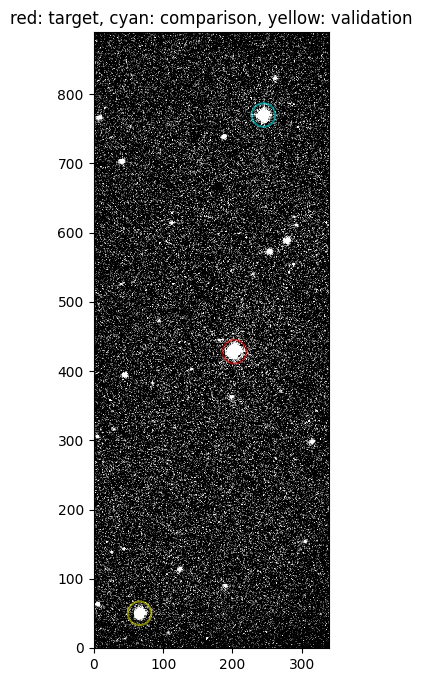

In [87]:
## 18. Define target, comparison and validation stars:

# We select these stars visuallyfrom the FITS image. It might need some iterations to find proper 
# comparison and validation stars. Their count value should be of the similar order

data=fits.getdata('/Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated/c13a_150210_023444_ori_Trim_only_v4_calibrated_light_div_flatonly_trimonlyv4.fits') 
# This is the position of the target star on the image:
x_targ,y_targ=(203,428)  
x_comp,y_comp=(245,770) 
x_vali,y_vali=(66,50)
aper_targ = CircularAperture((x_targ,y_targ), r=17.)
aper_comp = CircularAperture((x_comp,y_comp), r=17.)
aper_vali = CircularAperture((x_vali,y_vali), r=17.)
plt.figure(figsize=(8,8))
plt.imshow(data, cmap='Greys_r', origin='lower', vmin=0,vmax=50, interpolation='nearest')
aper_targ.plot(color='red', lw=1.5, alpha=0.5)
aper_comp.plot(color='cyan', lw=1.5, alpha=0.5)
aper_vali.plot(color='yellow', lw=1.5, alpha=0.5)
plt.title('red: target, cyan: comparison, yellow: validation')

In [88]:
## 19. Calculate light curves for a target star, a comparison star, and a validation star
# in all specified files c_files

from astropy.time import Time 
naper=len(radii)
nfiles=len(cfiles)
#print(nfiles)

#lc_targ, lc_comp, and lc_vali are NumPy arrays initialized to store light curve data for 
#the target, comparison, and validation stars, respectively.
lc_targ=np.zeros((1+2*naper,nfiles)) 
lc_comp=np.zeros((1+2*naper,nfiles)) 
lc_vali=np.zeros((1+2*naper,nfiles))

print("calculating light curves...") 

# For each file, it extracts the Modified Julian Date (MJD) from the observation date and time in the FITS header.
for i, ifile in enumerate(cfiles):
    rootname, _ = os.path.splitext(ifile)
    head = fits.getheader(ifile)
    datestr = head['DATE-OBS']  # Get the combined date and time
    date = np.array(datestr.split('T')[0].split('-')).astype('int')  # Extract year, month, day
    timestr = head['DATE-OBS'].split('T')[1]  # Get the time part
    datetime = "%4d-%02d-%02dT%s" % (date[0], date[1], date[2], timestr.strip())
    t = Time(datetime, format='isot', scale='utc') 
    jd=t.mjd
    lc_targ[0,i]=jd
    lc_comp[0,i]=jd
    lc_vali[0,i]=jd

    print("MJD: ",datetime,jd)
    catfile=rootname+'-cat.fits'
    print("reading:", i+1,len(cfiles),ifile)

    # Aperture Photometry:
    #   It reads a catalog file (catfile) associated with each FITS file.

    #The catalog contains positions (x, y) and photometry data for stars in the image.

    #The code identifies the closest star to predefined coordinates (x_targ, y_targ, x_comp, y_comp,
    # x_vali, y_vali) for the target, comparison, and validation stars.
    cat=fits.getdata(catfile)
    x=cat['x_sht']
    y=cat['y_sht']
    
    # get target star
    # Data Extraction:
    #If the closest star is within a certain distance threshold (less than 2 pixels in this case), 
    #it extracts the aperture sum and error for each aperture radius defined in radii.
    #This data is stored in the corresponding light curve arrays (lc_targ, lc_comp, lc_vali).
    #If no star is close enough, it assigns NaN (Not a Number) to indicate missing data.

    d=np.sqrt((x-x_targ)**2+(y-y_targ)**2)
    idx=np.argmin(d)
    icat=cat[idx]
    dt=d[idx]
#    if d[idx]<2:
#testing
    if d[idx]<3:
        for j in range(naper):
            lc_targ[j+1,i]=icat['aperture_sum_'+str(j)]
            lc_targ[naper+j+1,i]=icat['aperture_sum_err_'+str(j)]
    else: lc_targ[1:,i]=np.nan

#    print(lc_targ)
    # get comparison star
    d=np.sqrt((x-x_comp)**2+(y-y_comp)**2)
    idx=np.argmin(d)
    icat=cat[idx]
    dc=d[idx]
    if d[idx]<3:
        for j in range(naper):
            lc_comp[j+1,i]=icat['aperture_sum_'+str(j)]
            lc_comp[naper+j+1,i]=icat['aperture_sum_err_'+str(j)]
    else: lc_comp[1:,i]=np.nan
#    print(lc_comp)
    # get validation star
    d=np.sqrt((x-x_vali)**2+(y-y_vali)**2)
    idx=np.argmin(d)
    icat=cat[idx]
    dv=d[idx]
    if d[idx]<3:
        for j in range(naper):
            lc_vali[j+1,i]=icat['aperture_sum_'+str(j)]
            lc_vali[naper+j+1,i]=icat['aperture_sum_err_'+str(j)]
    else: lc_vali[1:,i]=np.nan
#    print(lc_vali)

    # Print distances to the closest stars and other info
    print(dt, dc, dv)
## The following print showed me that lc_comp does not have any Zero values for none of the 10 files
    #print(lc_comp)

calculating light curves...
MJD:  2015-02-10T02:33:28.668 57063.10658180556
reading: 1 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023444_ori_Trim_only_v4_calibrated_darkandflat.fits
1.688741081092329 0.266967629039547 2.1937134491829653
MJD:  2015-02-10T02:34:46.269 57063.10747996528
reading: 2 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023600_ori_Trim_only_v4_calibrated_darkandflat.fits
1.6813068620864768 0.6085332233376793 1.7660870508958069
MJD:  2015-02-10T02:36:03.820 57063.1083775463
reading: 3 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023719_ori_Trim_only_v4_calibrated_darkandflat.fits
1.7689079052326588 0.24710501904614104 2.2436342916450664
MJD:  2015-02-10T02:37:21.678 57063.10927868055
reading: 4 10 /Users/applestore/exo-observe/Data/WASP-12b-20150209/calibrated2/c13a_150210_023836_ori_Trim_only_v4_calibrated_darkandflat.fits
1.8407405669425034 0.2677288491450658 2

<>:52: SyntaxWarning: invalid escape sequence '\D'
<>:52: SyntaxWarning: invalid escape sequence '\D'
/var/folders/kb/x7gy6w9569jgnxt7cz_dpm1m0000gn/T/ipykernel_1336/992045308.py:52: SyntaxWarning: invalid escape sequence '\D'
  plt.ylabel('$\Delta m$')


photerr for target/comparison: 0.002932894906336047
photerr for validation/comparison: 0.0014641977378872842
(-0.5109838737518839, -0.5105822949892088, 0.0038611628047937655)


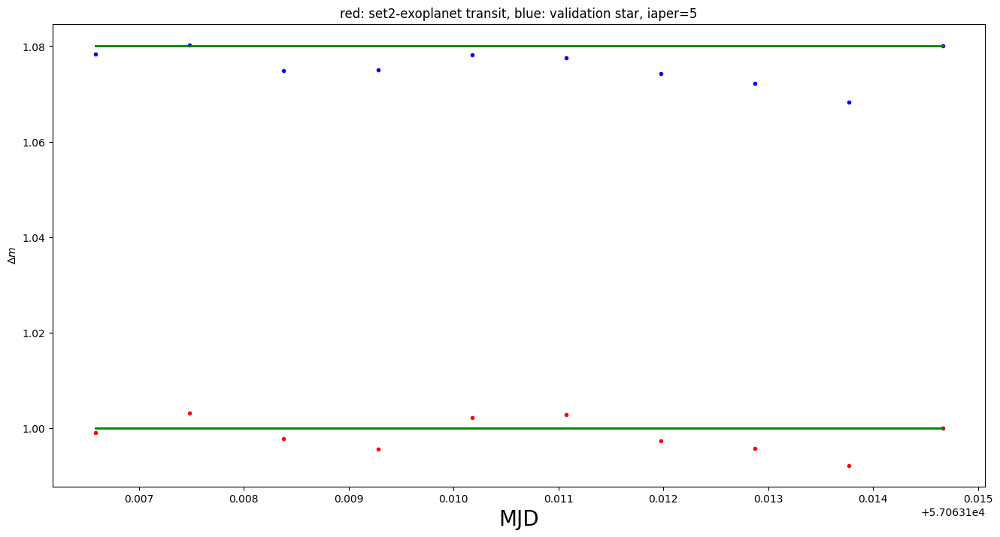

In [89]:
## 20. Plot light curves:

# Select the aperture index for which the light curve will be calculated
# aperture radii in pixels radii=[3,4,5,6,8,10,12,15,20,25] ##
iaper=5 # for iaper aperture 

# Calculate the relative light curve (rlc) for the target and validation stars
# by dividing their light curves by the comparison star's light curve
rlc_targ=lc_targ[iaper+1,:]/lc_comp[iaper+1,:] 
rlc_vali=lc_vali[iaper+1,:]/lc_comp[iaper+1,:]

# Calculate the photometric error for the target star
a1=1.0/lc_comp[iaper+1,:]; e1=lc_targ[iaper+naper+1,:]
a2=lc_targ[iaper+1,:]/lc_comp[iaper+1,:]**2; e2=lc_comp[iaper+naper+1,:]
rlcerr_targ=np.sqrt(a1**2*e1**2+a2**2*e2**2)

# Calculate the photometric error for the validation star
a1=1.0/lc_comp[iaper+1,:]; e1=lc_vali[iaper+naper+1,:]
a2=lc_vali[iaper+1,:]/lc_comp[iaper+1,:]**2; e2=lc_comp[iaper+naper+1,:]
rlcerr_vali=np.sqrt(a1**2*e1**2+a2**2*e2**2)

# Print the median photometric error for the target and validation stars
print('photerr for target/comparison:',np.median(rlcerr_targ))
print('photerr for validation/comparison:',np.median(rlcerr_vali))

# Find the index of the light curve closest to a specific Modified Julian Date (MJD)
# the following line is from the original tutorial
#idx=np.argmin(np.abs(lc_targ[0,:]-51888.67))

# In the Next line MJD is replaced by one of my 10 data files
idx=np.argmin(np.abs(lc_targ[0,:]-2457087.50))

# Normalize the relative light curves by the median after the specific MJD
norm_targ=np.median(rlc_targ[idx:])
norm_vali=np.median(rlc_vali[idx:])

# Prepare the x-axis range for plotting
tmpx=[np.min(lc_targ[0,:]),np.max(lc_targ[0,:])]

# Plot the normalized relative light curves for the target and validation stars
plt.figure(figsize=(16,8))
plt.plot(lc_targ[0,:],rlc_targ/norm_targ,'r.')
plt.plot(lc_targ[0,:],rlc_vali/norm_vali+0.08,'b.')

# Draw horizontal lines to indicate the normalized light level
plt.plot(tmpx,[1.0,1.0],'g-',linewidth=2)
plt.plot(tmpx,[1.08,1.08],'g-',linewidth=2)

# Set the y-axis limits and titles
#plt.ylim([0.96,1.10])
plt.xlabel('MJD',fontsize=20)
plt.ylabel('$\Delta m$')
title = plt.title(f"red: set2-exoplanet transit, blue: validation star, iaper={iaper}").get_text() # Get the title text
plt.savefig(title.replace(' ', '_') + ".png") # Save the figure using the title as the filename
# Calculate and print the sigma-clipped statistics for the validation star's light curve
print(sigma_clipped_stats(2.5*np.log10(rlc_vali),sigma=3,maxiters=3))